In [1]:
from glob import glob
import tifffile
import numpy as np
import matplotlib

from mpl_toolkits.axes_grid1.inset_locator import inset_axes

In [2]:
font = {
        'family' : 'monospace',
        'weight' : 'normal',
        'size'   : 9
        }

matplotlib.rc('font', **font)

In [3]:
for line in glob('../../data/*'):
    print(line)

../../data/CCFv3_annotation_25.nrrd
../../data/20161215_elav_nuc5FP_2onAEL_60minHS_3L_B_20x.czi_5Chn_MaxProj.jpg
../../data/tissue_hires_image.png
../../data/6.1.tif
../../data/182725_04301_Zprojection.tif
../../data/CCFv3_annotation_25.png
../../data/V1_Breast_Cancer_Block_A_Section_1_image.tif
../../data/nTracer_sample.tif
../../data/061022_642_17us_brain_liposomes.tif
../../data/noise.tif
../../data/20161215_elav_nuc5FP_2onAEL_60minHS_3L_B_20x.czi_5Chn.tif


In [4]:
datasets = [
    ('brainbow', '../../data/nTracer_sample.tif'),
    ('neurites','../../data/061022_642_17us_brain_liposomes.tif'),
    ('fly', '../../data/20161215_elav_nuc5FP_2onAEL_60minHS_3L_B_20x.czi_5Chn_MaxProj.jpg'),
    ('fMOST', '../../data/182725_04301_Zprojection.tif'),
    ('visium', '../../data/V1_Breast_Cancer_Block_A_Section_1_image.tif'),
    ('bead'),
    ('noise', '../../data/noise.tif'),
    ('segment', '../../data/CCFv3_annotation_25.nrrd')
]
datasets

[('brainbow', '../../data/nTracer_sample.tif'),
 ('neurites', '../../data/061022_642_17us_brain_liposomes.tif'),
 ('fly',
  '../../data/20161215_elav_nuc5FP_2onAEL_60minHS_3L_B_20x.czi_5Chn_MaxProj.jpg'),
 ('fMOST', '../../data/182725_04301_Zprojection.tif'),
 ('visium', '../../data/V1_Breast_Cancer_Block_A_Section_1_image.tif'),
 'bead',
 ('noise', '../../data/noise.tif'),
 ('segment', '../../data/CCFv3_annotation_25.nrrd')]

In [5]:
from matplotlib import pyplot

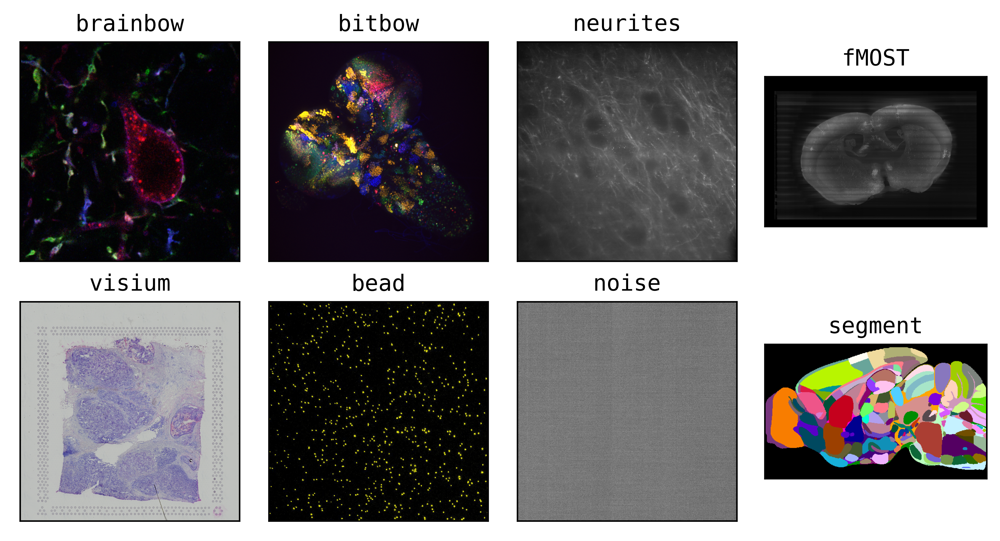

In [6]:
fig, axes = pyplot.subplots(2,4,figsize=(7.5,4),dpi=600)

for ax in axes.ravel():
    ax.set_xticks([])
    ax.set_yticks([])

img = tifffile.memmap(datasets[0][1])
img = np.array(img[70]).astype(float)
img[2] += img[3]
for i in range(img.shape[0]):
    img[i] /= img[i].max()
img = np.moveaxis(img,0,-1)
ax = axes[0,0]
ax.set_title("brainbow")
ax.imshow( img[...,:3] )
del img
    
img = tifffile.memmap(datasets[1][1])
img = img[50]
ax = axes[0,2]
ax.set_title("neurites")
ax.imshow( img, cmap='gray' )
del img

img = pyplot.imread(datasets[2][1])
ax = axes[0,1]
ax.set_title("bitbow")
ax.imshow( img )
del img

img = tifffile.imread(datasets[3][1])
img *= 100
img = img.T
ax = axes[0,3]
ax.set_title("fMOST")
ax.imshow( img, cmap='gray')
del img

#img = tifffile.imread(datasets[4][1])
img = pyplot.imread('../../data/tissue_hires_image.png')
ax = axes[1,0]
ax.set_title("visium")
ax.imshow(img)
del img

img = pyplot.imread('MAX_6.1.jpg')
ax = axes[1,1]
ax.set_title("bead")
ax.imshow(img[100:1000,100:1000], cmap='gray')
del img

img = tifffile.imread(datasets[6][1])
ax = axes[1,2]
ax.set_title("noise")
ax.imshow(img[50], cmap='gray')
del img

ax = axes[1,3]
ax.set_title("segment")
ax.imshow( pyplot.imread('../../data/CCFv3_annotation_25.png'))

#axins = inset_axes(axes[0,0], width=.5, height=.5, loc=1)
#axins.imshow( img[750:, 750:][:500,:500] )
#axins.set_xticks([])
#axins.set_yticks([])
#del img

#for ds,ax in zip(datasets, axes):
#    data = 

fig.tight_layout()

fig.savefig("overview_fig.pdf")